In [0]:
#!pip install kaggle

In [0]:
import os
import shutil
data='/dbfs/FileStore/tables/'

In [0]:
# create dir for kaggle.json
#mkdir ~/.kaggle

#move uploaded json file to above created folder
#cp /dbfs/FileStore/tables/dataapi/kaggle.json ~/.kaggle/

# change permission
#!chmod 600 ~/.kaggle/kaggle.json

# dowmload competetion data
#!kaggle competitions download big-data-derby-2022

#create folder for data
#!mkdir /dbfs/FileStore/tables/data/

#unzip downloaded data to data folder
#!unzip /databricks/driver/big-data-derby-2022.zip -d /dbfs/FileStore/tables/data/

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [0]:
data = '/dbfs/FileStore/tables/data/'
os.listdir(data)

Out[4]: ['final_data.csv',
 'nyra_2019_complete.csv',
 'nyra_race_table.csv',
 'nyra_start_table.csv',
 'nyra_tracking_table.csv']

In [0]:
start_columns = ['track_id' , 'race_date' , 'race_number', 'program_number', 'weight_carried', 'jockey', 'odds', 'position_at_finish']

columns = ['track_id' 'race_date' 'race_number'  'program_number', 'trakus_index', 'latitude', 'longitude', 'distance_id', 'course_type', 'track_condition', 'run_up_distance', 'race_type', 'post_time', 'weight_carried', 'jockey', 'odds', 'position_at_finish']

In [0]:
race = pd.read_csv('/dbfs/FileStore/tables/data/nyra_race_table.csv')
start = pd.read_csv('/dbfs/FileStore/tables/data/nyra_start_table.csv', header=None)
start.columns = start_columns
tracking = pd.read_csv('/dbfs/FileStore/tables/data/nyra_tracking_table.csv')
data = pd.merge(pd.merge(tracking, race, on=['track_id', 'race_date', 'race_number']), start, on=['track_id', 'race_date', 'race_number', 'program_number'])
data.to_csv('/dbfs/FileStore/tables/data/final_data.csv', index=None)

In [0]:
import pyspark as ps
new_cols = list(data.columns)

In [0]:
spark = ps.sql.SparkSession.builder.appName('load').getOrCreate()
race = spark.read.options(delimiter=',', inferSchema='True').csv('/FileStore/tables/data/nyra_race_table.csv')
start = spark.read.options(delimiter=',', inferSchema='True').csv('/FileStore/tables/data/nyra_start_table.csv')
tracking = spark.read.options(delimiter=',', inferSchema='True').csv('/FileStore/tables/data/nyra_tracking_table.csv')
data = spark.read.options(delimiter=',', inferSchema='True').csv('/FileStore/tables/data/final_data.csv')
data = data.filter(data._c0 != 'track_id')

In [0]:
old_cols = data.schema.names

In [0]:
# Rename columns
from functools import reduce

oldnames = data.schema.names
newnames = columns

data = reduce(lambda data, idx : data.withColumnRenamed(old_cols[idx], new_cols[idx]), range(len(oldnames)), data)
data.printSchema()

root
-- track_id: string (nullable = true)
-- race_date: string (nullable = true)
-- race_number: string (nullable = true)
-- program_number: string (nullable = true)
-- trakus_index: string (nullable = true)
-- latitude: string (nullable = true)
-- longitude: string (nullable = true)
-- distance_id: string (nullable = true)
-- course_type: string (nullable = true)
-- track_condition: string (nullable = true)
-- run_up_distance: string (nullable = true)
-- race_type: string (nullable = true)
-- purse: string (nullable = true)
-- post_time: string (nullable = true)
-- weight_carried: string (nullable = true)
-- jockey: string (nullable = true)
-- odds: string (nullable = true)
-- position_at_finish: string (nullable = true)

In [0]:
datapd=data.toPandas()

In [0]:
datapd.isna().sum()

Out[12]: track_id 0
race_date 0
race_number 0
program_number 0
trakus_index 0
latitude 0
longitude 0
distance_id 0
course_type 0
track_condition 0
run_up_distance 0
race_type 0
purse 0
post_time 0
weight_carried 0
jockey 0
odds 0
position_at_finish 0
dtype: int64

In [0]:
print('(',data.count(), len(data.columns),')')

( 5228430 18 )

In [0]:
data.printSchema()

root
-- track_id: string (nullable = true)
-- race_date: string (nullable = true)
-- race_number: string (nullable = true)
-- program_number: string (nullable = true)
-- trakus_index: string (nullable = true)
-- latitude: string (nullable = true)
-- longitude: string (nullable = true)
-- distance_id: string (nullable = true)
-- course_type: string (nullable = true)
-- track_condition: string (nullable = true)
-- run_up_distance: string (nullable = true)
-- race_type: string (nullable = true)
-- purse: string (nullable = true)
-- post_time: string (nullable = true)
-- weight_carried: string (nullable = true)
-- jockey: string (nullable = true)
-- odds: string (nullable = true)
-- position_at_finish: string (nullable = true)

In [0]:
datapd.describe()

Out[15]:

,track_id,race_date,race_number,program_number,trakus_index,latitude,longitude,distance_id,course_type,track_condition,run_up_distance,race_type,purse,post_time,weight_carried,jockey,odds,position_at_finish
count,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430,5228430
unique,3,217,13,20,1062,5224784,5224799,20,5,7,127,12,70,360,35,178,656,14
top,AQU,2019-08-24,8,4,1,43.0717923421774,-73.7646576687347,600,D,FT,54,CLM,41000,130,118,Manuel Franco,420,2
freq,2158369,43925,582413,611396,14915,98,98,1194752,3229234,2345748,798776,1142801,353152,94327,805184,444024,45315,703763


In [0]:
from pyspark.sql.functions import to_timestamp, to_date
data = data.withColumn('race_date', to_date(data.race_date, 'yyyy-MM-dd'))

In [0]:
from pyspark.sql.types import IntegerType, StringType, FloatType
from pyspark.sql.functions import *

target_dtypes = [StringType(), to_date(data.race_date, 'yyyy-MM-dd'), IntegerType(), StringType(), IntegerType(), FloatType(), FloatType(), IntegerType(), StringType(), StringType(), IntegerType(), StringType(), IntegerType(), IntegerType(), IntegerType(), StringType(), IntegerType(), IntegerType()]

for ncol, dtype in zip(data.columns, target_dtypes):
    if ncol == 'race_date':
        continue
    if dtype!=StringType():
        data = data.withColumn(ncol, data[ncol].cast(dtype))
    else:
        f = udf(lambda x : x.strip(), StringType())
        data = data.withColumn(ncol, f(col(ncol)))


In [0]:
data.printSchema()

root
-- track_id: string (nullable = true)
-- race_date: date (nullable = true)
-- race_number: integer (nullable = true)
-- program_number: string (nullable = true)
-- trakus_index: integer (nullable = true)
-- latitude: float (nullable = true)
-- longitude: float (nullable = true)
-- distance_id: integer (nullable = true)
-- course_type: string (nullable = true)
-- track_condition: string (nullable = true)
-- run_up_distance: integer (nullable = true)
-- race_type: string (nullable = true)
-- purse: integer (nullable = true)
-- post_time: integer (nullable = true)
-- weight_carried: integer (nullable = true)
-- jockey: string (nullable = true)
-- odds: integer (nullable = true)
-- position_at_finish: integer (nullable = true)

In [0]:
from pyspark.sql.functions import countDistinct
for col in data.columns:
    print(col, '  :  ', data.select(countDistinct(col).alias('count')).collect()[0][0])

track_id : 3
race_date : 217
race_number : 13
program_number : 20
trakus_index : 1062
latitude : 5241
longitude : 3629
distance_id : 20
course_type : 5
track_condition : 7
run_up_distance : 127
race_type : 12
purse : 70
post_time : 360
weight_carried : 35
jockey : 178
odds : 656
position_at_finish : 14

In [0]:
data = data.select(['jockey', 'track_id', 'race_number', 'race_date', 'race_type', 'distance_id', 'course_type', 'track_condition', 'trakus_index', 'program_number', 'latitude', 'longitude', 'run_up_distance', 'purse', 'post_time', 'weight_carried', 'odds', 'position_at_finish'])

In [0]:
from pyspark.sql.functions import col
import pyspark.sql.functions as F
pd.options.plotting.backend = "plotly"

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
import plotly.io as pio

pio.renderers.default = 'databricks'

In [0]:
from pyspark.sql.functions import col
unique_cols = list(set(data.columns)-set(['latitude', 'longitude', 'trakus_index']))

data_pd = data.toPandas()
data_pd = data_pd.groupby(unique_cols).size().reset_index()
data_pd = data_pd.sort_values(by='race_date')

unique_data = data.groupby(unique_cols).count().sort(col('race_date').asc())


In [0]:
# distribution of num cols 
num_cols = data_pd.select_dtypes(exclude='object').columns 
for col in num_cols[:-1]:
    f = data_pd.plot(kind='hist', marginal='box', x=col, title='Distribution of ' + str(col.replace('_',' ')))
    f.show()

In [0]:
# map dictionary 
track_condition_map = {'YL' : 'Yielding', 'FM' : 'Firm', 'SY' : 'Sloppy', 'GD' : 'Good', 'FT' : 'Fast', 'MY' : 'Muddy', 'SF' : 'Soft'}
course_type_map = {'M' : 'Hurdle', 'D' : 'Dirt', 'O' : 'Outer turf', 'I' : 'Inner turf', 'T' : 'turf'}
race_type_map = {'STK' : 'Stakes', 'WCL' : 'Waiver Claiming', 'WMC' : 'Waiver Maiden Claiming', 'SST' : 'Starter Stakes', 'SHP' : 'Starter Handicap', 'CLM' : 'Claiming', 'STR' : 'Starter Allowance', 'AOC' : 'Allowance Optionl Claimer', 'SOC' : 'Starter Optional Claimer', 'MCL' : 'Maiden Claiming', 'ALW' : 'Allowance', 'MSW' : 'Maiden Special Weight'}
track_id_map = {'AQU': 'Aqueduct', 'BEL' : 'Belmont', 'SAR' : 'Saratoga'}


In [0]:
# Date Range
data.select(F.countDistinct('race_date').alias('total unique dates')).show()
data.select(F.min('race_date').alias('min'), F.max('race_date').alias('max')).show()

+------------------+
total unique dates|
+------------------+
 217|
+------------------+

+----------+----------+
 min| max|
+----------+----------+
2019-01-01|2019-12-31|
+----------+----------+

In [0]:
# Jockey race count
data_pd.groupby(['jockey']).count().sort_values(by='course_type', ascending=False).reset_index().plot(kind='bar', x='jockey', y='course_type', labels={'course_type':'count'}, title = 'Races Done by Jockey')

Out[28]:

In [0]:
# Races done on given Date
data_pd.groupby('race_date').count().reset_index().plot(kind='line', x='race_date', y='course_type', labels={'course_type':'count'}, title = 'Races done on given Date')

Out[29]:

In [0]:
# Positions Count achieved by Jockey
d = data_pd.groupby(['position_at_finish', 'jockey']).count()
d=d['track_id'].groupby(['position_at_finish'], group_keys=False).nlargest(5)#.plot(kind='bar')
pd.DataFrame(d).reset_index().plot.bar(x='position_at_finish', y='track_id', color='jockey', labels={'track_id':'count'}, title='Position acheived by Jockey')


Out[30]:

In [0]:
top_n=15
d = pd.DataFrame(data_pd.groupby(['jockey', 'track_condition']).size()).rename(columns={0:'count'})
dd = d.groupby('jockey').sum()
d.loc[dd.nlargest(top_n, 'count').index].reset_index().applymap(lambda x: track_condition_map[x.strip()] if x in track_condition_map else x).sort_values(by='count', ascending=False).plot(kind='bar', x='jockey', y='count', color='track_condition', title='Track Condition on which Jockey done Races')

Out[31]:

In [0]:
# Races done by Days
d = data_pd.groupby(['race_date', 'race_type']).count() #.plot(x='race_date', y='track_id', color='race_type')
d.reset_index().applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).plot(kind='line', x='race_date', y='course_type', labels={'course_type':'count', 'race_type':'race type'}, color='race_type')

Out[32]:

In [0]:
# Race Count on given Track condition in a Day
d = data_pd.groupby(['race_date', 'track_condition']).count().sort_values(by='race_date').reset_index()
d['track_condition'] = d['track_condition'].apply(lambda x: track_condition_map[x.strip()])
d.plot(x='race_date', y='track_id', color='track_condition', labels={'track_id':'count'}, title='Race Count on given Track condition in a Day')

Out[33]:

In [0]:
# Race Count on given Course Type in a Day
d = data_pd.groupby(['race_date', 'course_type']).count().sort_values(by='race_date').reset_index()
d['course_type'] = d['course_type'].apply(lambda x: course_type_map[x.strip()])
d.plot(x='race_date', y='track_id', color='course_type', labels={'track_id':'count'}, title='Race Count on given Course Type in a Day')

Out[34]:

In [0]:
# Win position over track Condition
d = data_pd.groupby(['course_type', 'position_at_finish']).count().unstack(0).fillna(0)['track_id'].sort_index().divide(data_pd['course_type'].value_counts().sort_index()*0.01).T.reset_index()

d['course_type'] = d['course_type'].apply(lambda x: course_type_map[x])
specs = [[{'type':'domain'}]*7]*2
fig = make_subplots(rows=2, cols=7, specs=specs)

for n, ncol in enumerate(d.columns[1:]):
    fig.add_trace(go.Pie(values=d[ncol], labels=d["course_type"], title=str(ncol)), row=n//7+1, col=n%7+1)

fig.update_layout(title='Win position over Course Type', height=450, width=1300)

Out[82]:

In [0]:
# Win position over track Condition
d = data_pd.groupby(['track_condition', 'position_at_finish']).count().unstack(0).fillna(0)['track_id'].sort_index().divide(data_pd['track_condition'].value_counts().sort_index()*0.01).T.reset_index()

d['track_condition'] = d['track_condition'].apply(lambda x: track_condition_map[x.strip()])

specs = [[{'type':'domain'}]*7]*2
fig = make_subplots(rows=2, cols=7, specs=specs)

for n, ncol in enumerate(d.columns[1:]):
    fig.add_trace(go.Pie(values=d[ncol], labels=d["track_condition"], title=str(ncol)), row=n//7+1, col=n%7+1)

fig.update_layout(title='Win Position over Track Condition', height=450, width=1250)

Out[81]:

In [0]:
# above race played on each condition are not same so in denominator total race play on that particular condition

In [0]:
datapd=data.toPandas()

In [0]:
#Runup distance - track type
unique_data.groupby('track_condition').mean().toPandas().sort_values(by='avg(run_up_distance)').applymap(lambda x: track_condition_map[x.strip()] if x in track_condition_map else x).plot(kind='bar', x='track_condition', y='avg(run_up_distance)', labels={'avg(run_up_distance)':'AVG Run up distance'}, title='mean run up distance over track condition')

Out[39]:

In [0]:
unique_data.groupby('course_type').mean().toPandas().sort_values(by='avg(run_up_distance)').applymap(lambda x: course_type_map[x.strip()] if x in course_type_map else x).plot(kind='bar', x='course_type', y='avg(run_up_distance)', labels={'avg(run_up_distance)':'AVG Run up distance'}, title='mean run up distance over course type')

Out[40]:

In [0]:

unique_data.groupby('race_type').mean().toPandas().sort_values(by='avg(run_up_distance)').applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).plot(kind='bar', x='race_type', y='avg(run_up_distance)', labels={'avg(run_up_distance)':'AVG Run up distance'}, title='mean run up distance over race type')


Out[41]:

In [0]:
# total purse of date
from pyspark.sql.functions import col
unique_data.groupby('race_date').mean().select('avg(purse)', 'race_date').sort(col('race_date')).toPandas().plot(kind='line', x='race_date', y='avg(purse)', labels={'avg(purse)':'avg of purse value'}, title='avg purse value over date')

Out[42]:

In [0]:
unique_data.groupby(['race_date', 'race_number']).mean().select('avg(purse)', 'race_date', 'race_number').sort(col('race_date'), col('race_number')).toPandas().plot(kind='line', x='race_date', y='avg(purse)', color='race_number', labels={'avg(purse)':'avg of purse value'}, title='purse value of races done over day')


Out[43]:

In [0]:
# post time analysis
unique_data = unique_data.withColumn('post_time_hr', (unique_data.post_time/100).astype('int'))

In [0]:
unique_data.select('post_time_hr').toPandas().plot(kind='hist', x='post_time_hr', marginal='box', title='Distribution of Post time Hr')

Out[45]:

In [0]:

unique_data.groupby(['post_time_hr', 'position_at_finish']).count().toPandas().sort_values(by=['post_time_hr', 'position_at_finish']).plot(kind='line', x='post_time_hr', y='count', color='position_at_finish', title='win position over day time hour')

Out[46]:

In [0]:
colors = ["#FFFFFF", "#6CD4FF", "#F7DF00", "#E60000"]
data_pd['post_time_hr'] = data_pd['post_time'].apply(lambda x: x/100)
fig = px.scatter(data_pd, x = "post_time_hr", y = "run_up_distance", hover_data = [],
                 color = "position_at_finish", color_discrete_sequence = colors, #range_color = (0, 9999),
                 title = "post time hr by Run Up Distance")

fig.update_traces(marker = dict(size = 4, symbol = "square")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))
fig.show()

In [0]:
unique_data.groupby(['post_time_hr', 'course_type']).count().toPandas().sort_values(by=['post_time_hr', 'course_type']).applymap(lambda x: course_type_map[x.strip()] if x in course_type_map else x).plot(kind='line', x='post_time_hr', y='count', color='course_type', title='Course type over day time hour')

Out[48]:

In [0]:

unique_data.groupby(['post_time_hr', 'track_condition']).count().toPandas().sort_values(by=['post_time_hr', 'track_condition']).applymap(lambda x: track_condition_map[x.strip()] if x in track_condition_map else x).plot(kind='line', x='post_time_hr', y='count', color='track_condition', title='Track condition over day time hour')

Out[49]:

In [0]:
# Race type
unique_data.groupby(['race_type', 'course_type']).count().toPandas().applymap(lambda x: course_type_map[x.strip()] if x in course_type_map else x).applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).plot(kind='bar', 
x='race_type',
y='count',
color='course_type',
title='Race type and Course type')

Out[50]:

In [0]:
# Course type and Track condition
from scipy.stats import chi2_contingency
cont_df = pd.crosstab(data_pd['course_type'], data_pd['track_condition'])
cont_df_per = cont_df.divide(cont_df.sum(axis=0)*0.01).round(2).reset_index()
cont_df_per['course_type'] = cont_df_per['course_type'].apply(lambda x: course_type_map[x])


In [0]:

specs = [[{'type':'domain'}]*7]
fig = make_subplots(rows=1, cols=7, specs=specs)

for n, ncol in enumerate(cont_df_per.columns[1:]):
    fig.add_trace(go.Pie(values=cont_df_per[ncol], labels=cont_df_per["course_type"], title=track_condition_map[ncol.strip()]), row=n//7+1, col=n%7+1)

fig.update_layout(title='Relation between Course Type and Track Condition', height=450, width=1300)

Out[77]:

In [0]:
unique_data.groupby(['race_type', 'track_condition']).count().toPandas().applymap(lambda x: track_condition_map[x.strip()] if x in track_condition_map else x).applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).plot(kind='bar', 
x='race_type',
y='count',
color='track_condition',
title='Race type and Track condition')


Out[53]:

In [0]:
d = data_pd.groupby(['race_type', 'jockey']).count().applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x)
d=d['track_id'].groupby(['race_type'], group_keys=False).nlargest(5)#.plot(kind='bar')
pd.DataFrame(d).reset_index().applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).plot.bar(x='race_type', y='track_id', color='jockey', labels={'track_id':'count'}, title='Race type played by jockey')

Out[54]:

In [0]:
# weight_carried
unique_data.select('weight_carried').toPandas().plot(kind='hist', x='weight_carried', marginal="box", title='Distribution of Weight Carried')

Out[55]:

In [0]:
data_pd.groupby('course_type').median().reset_index()[['weight_carried', 'course_type']].applymap(lambda x: course_type_map[x.strip()] if x in course_type_map else x).plot(kind='bar', x='course_type', y='weight_carried', title='weight carried over different course type', labels={'weight_carried':'median weight carried'})

Out[56]:

In [0]:
data_pd.groupby('race_type').median().reset_index()[['weight_carried', 'race_type']].applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).plot(kind='bar', x='race_type', y='weight_carried', title='weight carried over different race type', labels={'weight_carried':'median weight carried'})

Out[57]:

In [0]:

data_pd.groupby('track_condition').median().reset_index()[['weight_carried', 'track_condition']].applymap(lambda x: track_condition_map[x.strip()] if x in track_condition_map else x).plot(kind='bar', x='track_condition', y='weight_carried', title='weight carried over different track condition', labels={'weight_carried':'median weight carried'})

Out[58]:

In [0]:
#cat - cat analysis
cat_cols = ['course_type', 'track_condition', 'race_type']
for c1 in range(len(cat_cols)):
    for c2 in range(c1+1, len(cat_cols)):
        cont_df = pd.crosstab(data_pd[cat_cols[c1]], data_pd[cat_cols[c2]])
        chi2_stat, p, dof, expected = chi2_contingency(cont_df)
        if p<0.05:
            print(cat_cols[c1], 'and', cat_cols[c2], 'are dependent and p value = ', p)
        else:
            print(cat_cols[c1], 'and', cat_cols[c2], 'are independent.')


course_type and track_condition are dependent and p value = 0.0
course_type and race_type are dependent and p value = 1.197504521694074e-165
track_condition and race_type are dependent and p value = 3.1263354356624246e-157

In [0]:
#track id
unique_data.groupby(['track_id', 'race_type']).count().toPandas().applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).applymap(lambda x: track_id_map[x.strip()] if x in track_id_map else x).plot(kind='bar', x='race_type', y='count', color='track_id', title='track id and race type')

Out[60]:

In [0]:
#track id
unique_data.groupby(['track_id', 'track_condition']).count().toPandas().applymap(lambda x: track_condition_map[x.strip()] if x in track_condition_map else x).applymap(lambda x: track_id_map[x.strip()] if x in track_id_map else x).plot(kind='bar', x='track_condition', y='count', color='track_id', title='track id and track condition')


Out[61]:

In [0]:
#track id
unique_data.groupby(['track_id', 'course_type']).count().toPandas().applymap(lambda x: course_type_map[x.strip()] if x in course_type_map else x).applymap(lambda x: track_id_map[x.strip()] if x in track_id_map else x).plot(kind='bar', x='course_type', y='count', color='track_id', title='track id and course type')

Out[62]:

In [0]:
# race distance 
data_pd.groupby(['race_type']).median().applymap(lambda x: race_type_map[x.strip()] if x in race_type_map else x).reset_index().plot(kind='bar', x='race_type', y='distance_id', title='race distance and race type', labels={'distance_id' : 'median race distance'})

Out[63]:

In [0]:

data_pd.groupby(['track_condition']).median().applymap(lambda x: track_condition_map[x.strip()] if x in track_condition_map else x).reset_index().plot(kind='bar', x='track_condition', y='distance_id', title='race distance and track condition', labels={'distance_id' : 'median race distance'})

Out[64]:

In [0]:
datac = data.select(['race_date', 'race_number', 'jockey', 'odds']).toPandas()
datac['odds'] = datac['odds'].apply(lambda x: x/100)
datac.groupby(['race_date', 'race_number', 'jockey']).mean().reset_index().sort_values(by='race_date').plot(x='race_date', y='odds', color='jockey', title='avg odds of jockey in each race')

Out[65]:

In [0]:
data_pd.sort_values(by=['race_date','race_number'])#group('race_date', 'race_number', 'purse')
for col in ['weight_carried', 'position_at_finish', 'run_up_distance', 'distance_id']:
    print(col, ': ', np.corrcoef(data_pd['odds'].values, data_pd[col].values)[0][1])

weight_carried : -0.13110652350501711
position_at_finish : 0.46802973683152366
run_up_distance : 0.01406836449793355
distance_id : -0.018365581168222577

In [0]:
colors = ["#FFFFFF", "#6CD4FF", "#F7DF00", "#E60000"]
fig = px.scatter(data_pd, x = "weight_carried", y = "odds", hover_data = ["race_number", "jockey"],
                 color = "odds", color_continuous_scale = colors, range_color = (0, 9999),
                 title = "Odds by Weight Carried")

fig.update_traces(marker = dict(size = 8, symbol = "circle")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))
fig.show()

In [0]:

fig = px.scatter(data_pd, x = "position_at_finish", y = "odds", hover_data = ["race_number", "jockey"],
                 color = "odds", color_continuous_scale = colors, range_color = (0, 9999),
                 title = "Odds by position at finish")

fig.update_traces(marker = dict(size = 8, symbol = "circle")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))
fig.show()

In [0]:
data_pd['day'] = data_pd['race_date'].apply(lambda x: x.day)

fig = px.scatter(data_pd, x = "weight_carried", y = "odds", hover_data = ["race_number", "jockey"],
                 color = "odds", color_continuous_scale = colors, range_color = (0, 9999),
                 title = "Odds by Weight Carried")

fig.update_traces(marker = dict(size = 9, symbol = "square")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))
fig.show()

In [0]:

fig = px.scatter(data_pd, x = "distance_id", y = "odds", hover_data = ["race_number", "jockey"],
                 color = "odds", color_continuous_scale = colors, range_color = (0, 9999),
                 title = "distance id by odds")

fig.update_traces(marker = dict(size = 9, symbol = "square")) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))
fig.show()

In [0]:
from pyspark.sql.functions import month

def get_pdddf(racetype=[], racenum=[], jockey=[], trackid=[], month=[]):
    d = datapd.copy()
    if len(racetype)!=0:
        d = d[d['race_type'].isin(racetype)]
    if len(racenum)!=0:
        d = d[d['race_number'].isin(racenum)]
    if len(jockey)!=0:
        d = d[d['jockey'].isin(jockey)]
    if len(trackid)!=0:
        d = d[d['track_id'].isin(trackid)]
    if len(month)!=0:
        d = d[d['month'].isin(month)]
    return d

datapd['month'] = datapd['race_date'].apply(lambda x: x.month)
data = data.withColumn('month', month(data.race_date))


In [0]:
from pyspark.sql.functions import col
test1 = data.filter((data.race_date=='2019-01-01')&(data.race_number==1)).select('jockey', 'trakus_index', 'latitude', 'longitude').sort(col('jockey'), col('trakus_index')).toPandas()

lat_range = (test1.latitude.min(), test1.latitude.max())
lon_range = (test1.longitude.min(), test1.longitude.max())


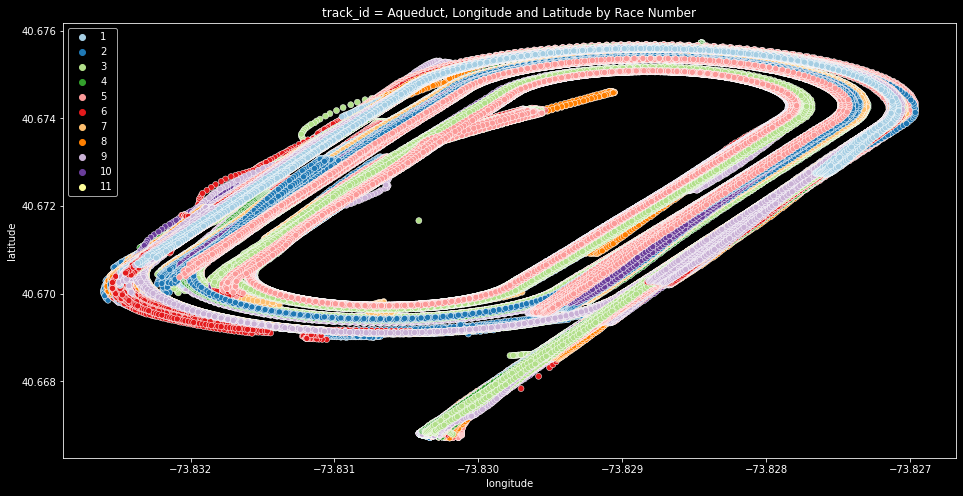

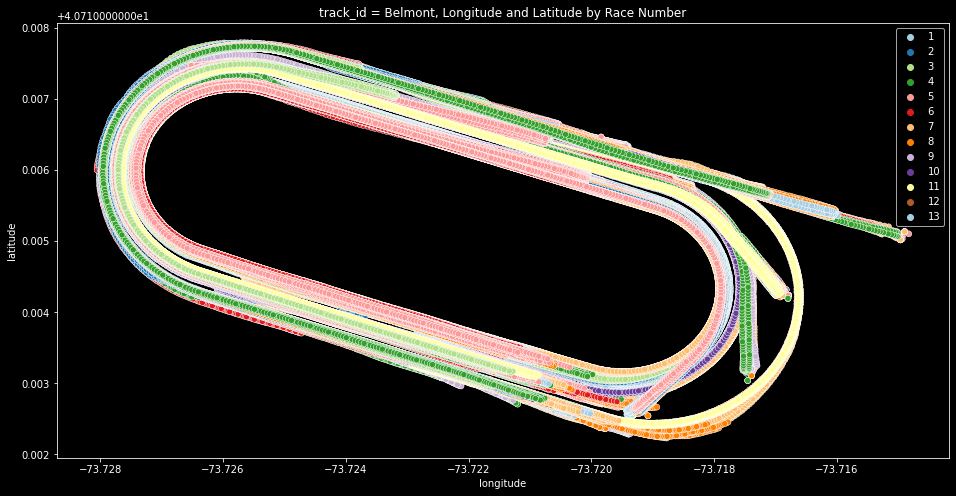

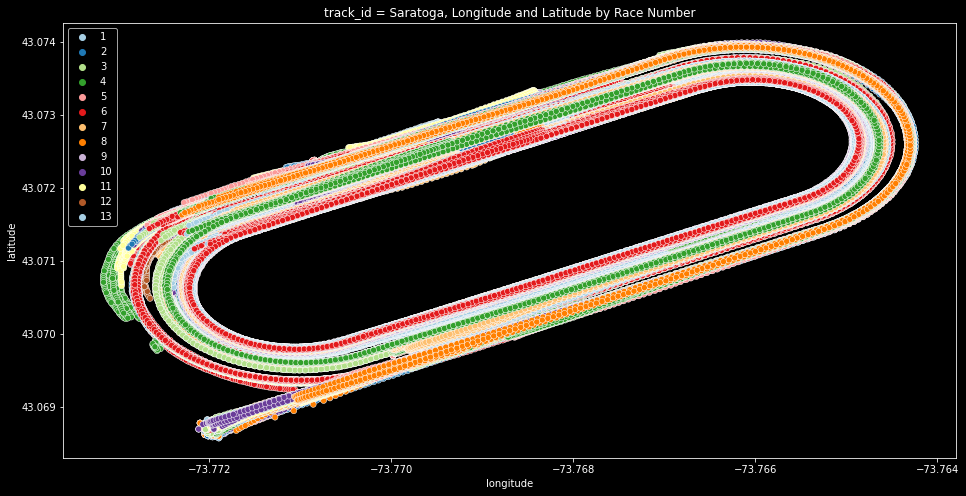

In [0]:
for c in datapd['track_id'].unique():
    d = get_pdddf(racetype=[], racenum=[], jockey=[], trackid=[c], month=[])
    plt.style.use("dark_background")
    plt.figure(figsize = (16, 8))
    sns.scatterplot(data = d, x = "longitude", y = "latitude", hue = "race_number", palette = "Paired")

    plt.title(f"track_id = {track_id_map[c]}, Longitude and Latitude by Race Number")
    plt.legend()
    plt.show()

In [0]:
# BEL
d = datapd[(datapd['track_id']=='BEL') & (datapd['jockey']=='Dylan Davis')].head(400)
    
fig = px.scatter(d, x = "longitude", y = "latitude", opacity = 0.8,
                    hover_data = ["race_date", "distance_id", "purse"],
                    color = "trakus_index", color_continuous_scale = "Turbo", #range_color = (0, 399),
                    title = f"Dylan Davis Race Pathing track_id = {c}")

fig.update_traces(marker = dict(symbol = "square-open", size = 20)) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

In [0]:
# AQU
c='AQU'
d = datapd[(datapd['track_id']=='AQU') & (datapd['jockey']=='Dylan Davis')].head(500)
    
fig = px.scatter(d, x = "longitude", y = "latitude", opacity = 0.8,
                    hover_data = ["race_date", "distance_id", "purse"],
                    color = "trakus_index", color_continuous_scale = "Turbo", #range_color = (0, 399),
                    title = f"Dylan Davis Race Pathing track_id = {c}")

fig.update_traces(marker = dict(symbol = "square-open", size = 20)) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

In [0]:
# SAR
c='SAR'
d = datapd[(datapd['track_id']=='SAR') & (datapd['jockey']=='Dylan Davis')].head(500)
    
fig = px.scatter(d, x = "longitude", y = "latitude", opacity = 0.8,
                    hover_data = ["race_date", "distance_id", "purse"],
                    color = "trakus_index", color_continuous_scale = "Turbo", #range_color = (0, 399),
                    title = f"Dylan Davis Race Pathing track_id = {c}")

fig.update_traces(marker = dict(symbol = "square-open", size = 20)) # scaling the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()